# San Francisco crime data

Data exploration of temporal and spatial patterns in crime data from San Francisco. Lastly, applying and comparing two classification algorithms - K nearest neighbor and Random Forest - for predicting crime type

**Import libraries**

In [1]:
import pandas as pd
import numpy as np
import random

# libraries for viz
import folium
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() # Set searborn as default
color = "firebrick"


# machine learning models from sklearn lib
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split


## 1 Data Collection 

No collection needed. 

## 2 Preparation

### 2.1 Load and merge data sources

In [2]:
# read crime data
df = pd.read_csv('data/sf_data.csv',delimiter=';')

# read distict data
dis = pd.read_csv('data/sf_districts.csv',delimiter=';')

# merge two data sets on 'id'
df = pd.merge(df,dis, on='id',how='left')
df.head(3)

,id,category,description,weekday,date,time,resolution,longitude,latitude,label,district
0,5069701104134,assault,battery,wednesday,06/22/2005,12:20,none,-122.428223,37.781896,violent,NaN
1,6074729204104,assault,assault,saturday,07/15/2006,00:55,none,-122.410672,37.799789,violent,NaN
2,7103536315201,assault,stalking,tuesday,09/25/2007,00:01,none,-122.458226,37.741362,violent,NaN


In [3]:
print('Rows: ',len(df))
print('Columns: ',len(df.columns))

Rows:  2129216
Columns:  11


### 2.2 Missing values and data types

Check for missing values and replace those in district with 'Unknown'.
Change time variables to datetime type. 

In [4]:
# Get missing values and data types
d = {'NaN values': df.isna().sum(),'Data types': df.dtypes}
check = pd.DataFrame(data=d)

# replace NaNs with 'Unknown' district
df['district'] = df['district'].fillna('unknown')
check['NaN values (2.0)'] = df.isna().sum()

# change date to datetime
df['date'] = pd.to_datetime(df.date)
check['New data types'] = df.dtypes

print('Time range:', df.date.min(),'-',df.date.max())
display(check)


Time range: 2003-01-01 00:00:00 - 2018-05-15 00:00:00


,NaN values,Data types,NaN values (2.0),New data types
id,0,int64,0,int64
category,0,object,0,object
description,0,object,0,object
weekday,0,object,0,object
date,0,object,0,datetime64[ns]
time,0,object,0,object
resolution,0,object,0,object
longitude,0,float64,0,float64
latitude,0,float64,0,float64
label,0,object,0,object


### 2.3 Transformations

Adding time variables

In [7]:

# Add variables for single time measures
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['hour'] = pd.to_datetime(df.time)
df['hour'] = df['hour'].dt.round('H').dt.hour

# add weekday as number
weekdays = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday','sunday']
weekdaysIndex = dict(zip(weekdays,range(len(weekdays))))
df['weekday_num'] = df['weekday']
df.replace({"weekday_num": weekdaysIndex},inplace=True)


display(df.head(3))

,id,category,description,weekday,date,time,resolution,longitude,latitude,label,district,year,month,hour,weekday_num
0,5069701104134,assault,battery,wednesday,2005-06-22,12:20,none,-122.428223,37.781896,violent,unknown,2005,6,12,2
1,6074729204104,assault,assault,saturday,2006-07-15,00:55,none,-122.410672,37.799789,violent,unknown,2006,7,1,5
2,7103536315201,assault,stalking,tuesday,2007-09-25,00:01,none,-122.458226,37.741362,violent,unknown,2007,9,0,1


## 3 Exploration

Exploring overall counts as well as temporal and spatial trends for the crimes

### 3.1 Overall count of crimes





**Define function to create barchart**

In [13]:
# outputs barchart of count of crimes 
# takes as input the variable we want to see the number of crimes for, then if horizontal or not and size of plot

def dist_overall(var,hz,size):
    df_cat = df.groupby(var).count()
    df_cat = df_cat.sort_values(by='id',ascending=True)
    
    if var=='year':
         df_cat = df_cat.sort_values(by='year',ascending=True)[:-1]

    plt.figure(figsize=size)
    
    if hz==True:
        plt.barh(df_cat.index,df_cat.id,color=color)
        plt.xlabel('Count')
    else:
        plt.bar([str(i) for i in df_cat.index],df_cat.id,color=color)
        plt.ylabel('Count')
    
    
        
    
    plt.title(f'Count of crimes for each {var}',fontsize=16)
    plt.xticks(rotation=0,fontsize=13)
    plt.yticks(fontsize=13)

    plt.show()

**Make plots**

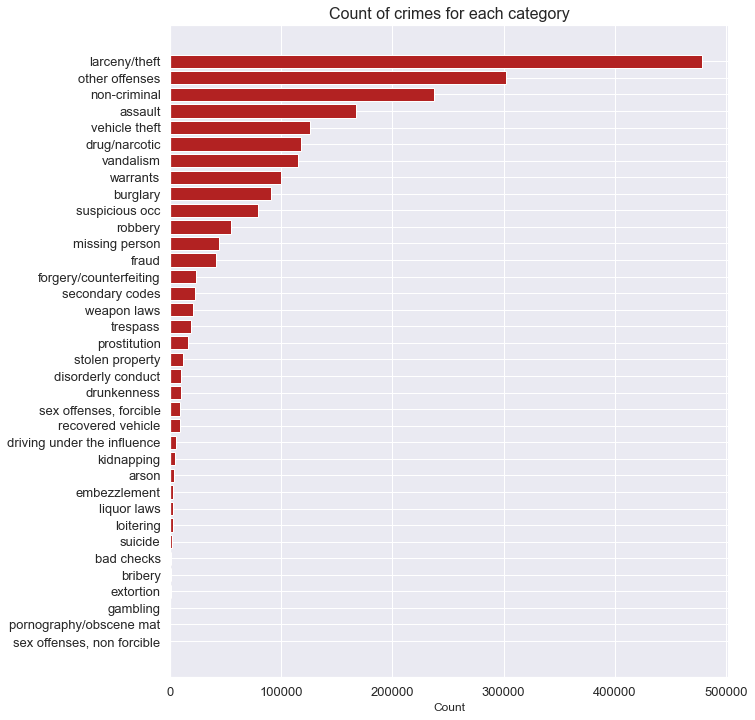

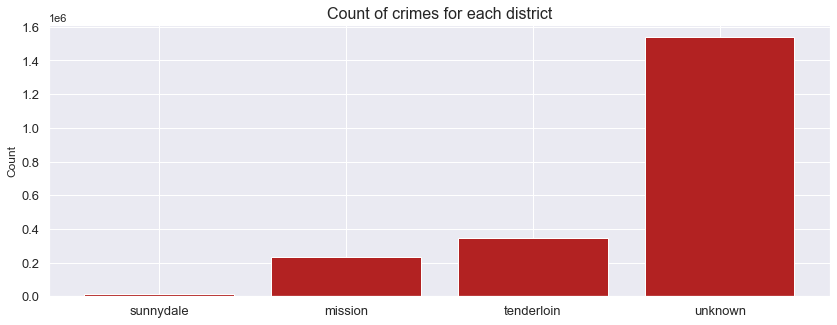

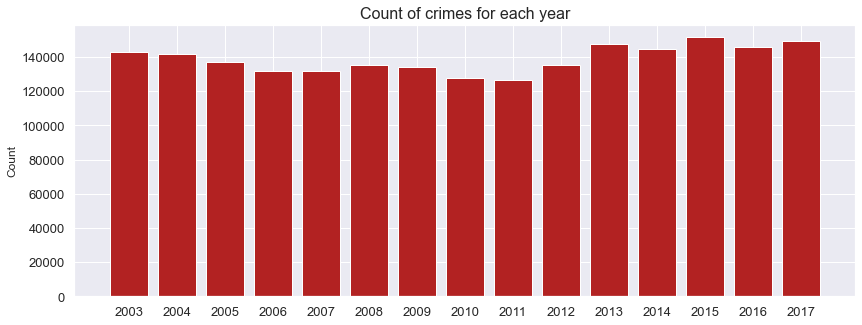

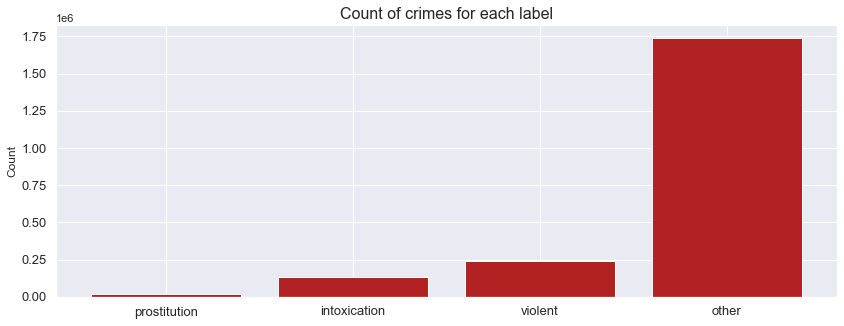

In [9]:
dist_overall('category',True,(10,12))
dist_overall('district',False,(14,5))
dist_overall('year',False,(14,5))
dist_overall('label',False,(14,5))

**Choose focus crimes**

For simplicity we already narrow down to six different crime types:

In [12]:
# get counts of each category and filter out some crimes
df_cat = df.groupby('category').count().sort_values(by='id')
focus = df_cat[df_cat.id>9000].index
focus = focus.drop('other offenses').drop('non-criminal').drop('secondary codes').drop('larceny/theft').drop('suspicious occ').drop('stolen property')
print(list(focus))

focus = ['drug/narcotic','vandalism','fraud','trespass','prostitution','drunkenness']

# filter on focus crimes
df_foc = df[df.category.isin(focus)].reset_index(drop=True)

['drunkenness', 'disorderly conduct', 'prostitution', 'trespass', 'weapon laws', 'forgery/counterfeiting', 'fraud', 'missing person', 'robbery', 'burglary', 'warrants', 'vandalism', 'drug/narcotic', 'vehicle theft', 'assault']


### 3.2 Temporal patterns

Explore the temporal trends for different crime categories

**Define function to create subplots**

In [14]:
# this function takes a time variable as input 
# then outputs a barchart for each crime category over that period

def dist_plot(time_var):

    fig = plt.figure(figsize=(17,16))

    for i,crime in enumerate(focus):
        df_filt = df_foc[df_foc.category==crime]
        df_filt2 = df_filt.groupby(time_var).count().sort_values(by=time_var)
      
        ax = fig.add_subplot(5,3,i+1)
        x=df_filt2.index
        y =df_filt2.id
        
        if time_var=='year':
            plt.plot(x[:-1],y[:-1],color=color)
        else:
            plt.bar(x,y,color=color)
        
        plt.title(crime,fontsize=14)
        plt.ylabel('Count')
        
        if time_var=='weekday_num':
            plt.xticks(np.arange(7), ['Mon', 'Tue', 'Wed', 'Thur', 'Fri', 'Sat','Sun'],fontsize=12)
        elif time_var =='month':
             plt.xticks(np.arange(1,13),['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov','Dec'],fontsize=12)
        elif time_var=='hour':
            plt.xticks(np.arange(24),[str(i).zfill(2) for i in (np.arange(24))],fontsize=12)
        

    plt.tight_layout()


**Yearly development**

Excluding year 2018 as only half the year is in the data

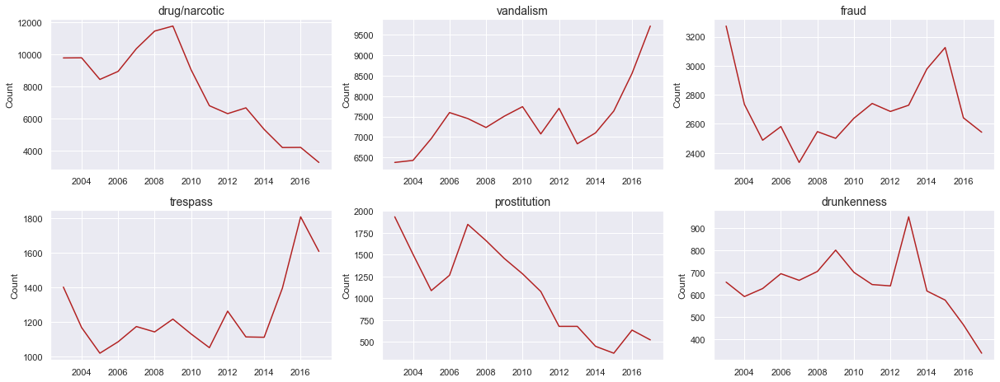

In [15]:
dist_plot('year')


**Monthly trends**

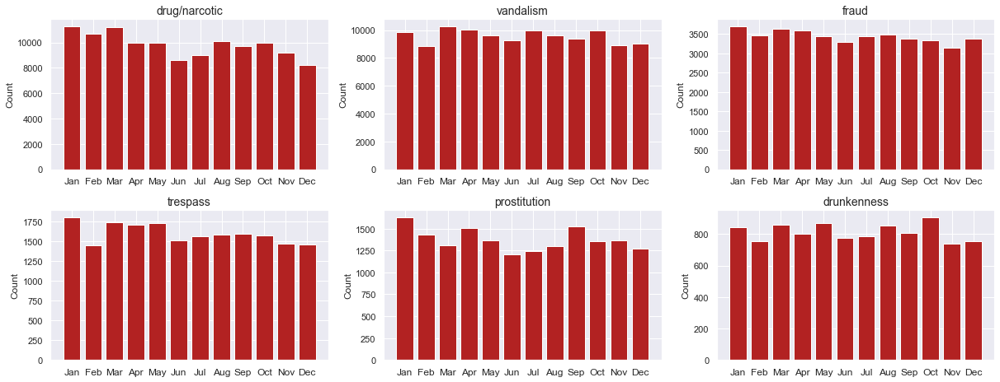

In [16]:
dist_plot('month')

**Weekly trends**

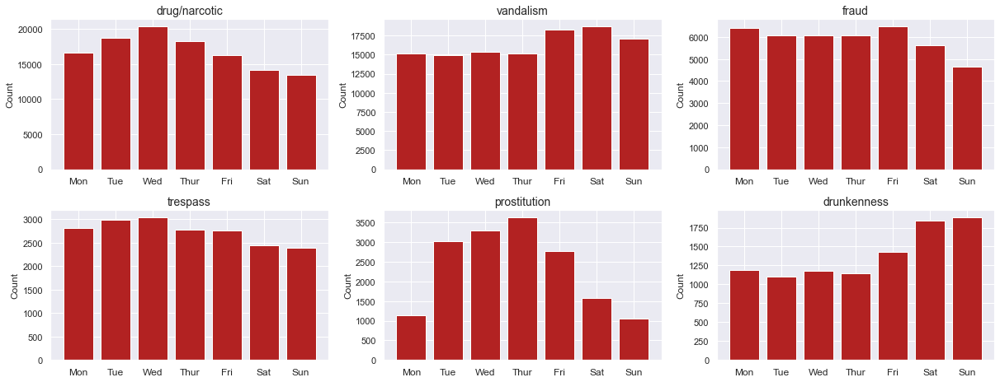

In [17]:
dist_plot('weekday_num')

**24 hour cycle trends**

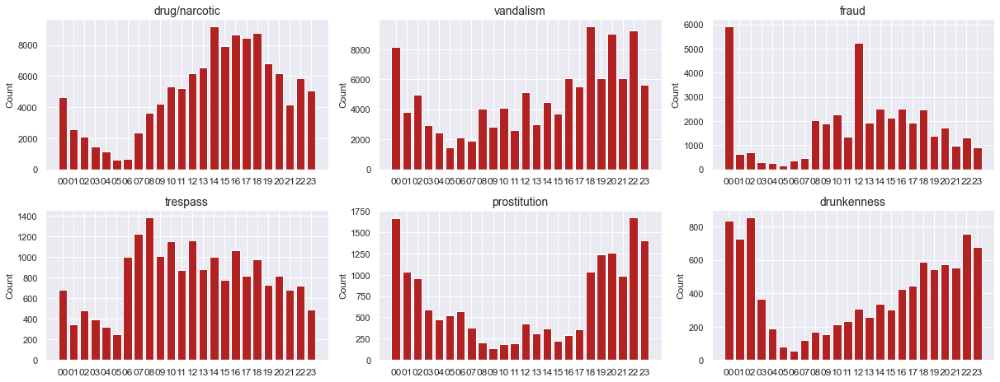

In [18]:
dist_plot('hour')

### 3.3 Spatial patterns

Explore trends for location of crimes 

*OBS: we only have 3 districts - it would have been optimal to map coordinates within all districts of SF*


**Distrubtion of crimes in districts**

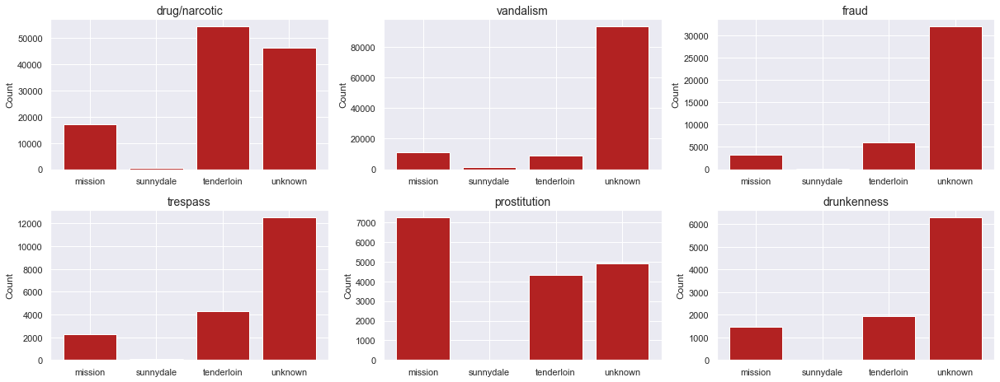

In [19]:
dist_plot('district')

**Map locations of chosen crimes**

It is chosen to only focus on two crime types in year 2017.

- drug/narcotic
- vandalism

In [20]:
# coordinates of San Francisco

SF_loc = [37.7792808, -122.4192363]

# colors for crimes
colors=['midnightblue','firebrick']
  
# create baseline map
m = folium.Map(location=SF_loc, zoom_start=11.5, tiles='Stamen Toner')

# plot locations
for crime,col in zip(focus[:2][::-1],colors):         
    # filter on crime
    df_foc1 = df_foc[(df_foc.category==crime) & (df_foc.year==2015)]
     
    #loop over each crime location 
    for i in range(len(df_foc1)):
        folium.Circle(
            location=[df_foc1.iloc[i]['latitude'], df_foc1.iloc[i]['longitude']],
            radius=10,
            fill=True,
            color=col,
            fill_opacity=0.2,
            tooltip =crime
        ).add_to(m)
m



**Spread of coordinates**

Only vandalism and drug/narcotic

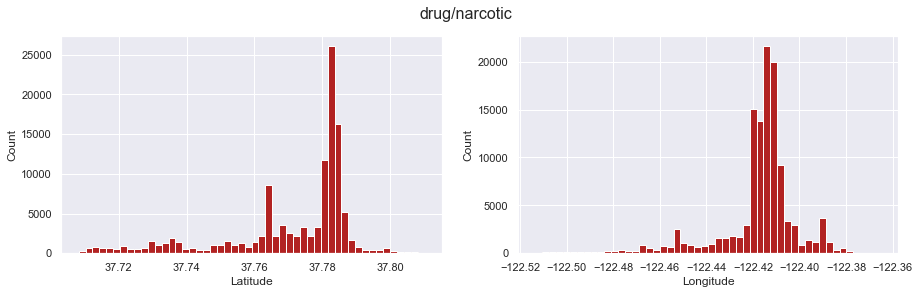

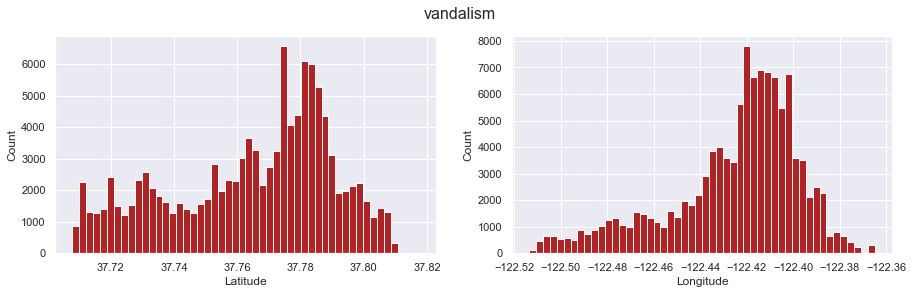

In [21]:
# takes as input the crime type and outputs two plots with dist of lat and long

def plot_lat_long(c):
    
        fig = plt.figure(figsize=(15,4))
        fig.suptitle(c, fontsize=16)

        df_foc1 = df_foc[(df_foc.category==c)]
     
        ax = fig.add_subplot(1,2,1)
        plt.hist(df_foc1['latitude'], bins=50,color=color)
        plt.xlabel('Latitude')
        plt.ylabel('Count')
   
        ax = fig.add_subplot(1,2,2)
        plt.hist(df_foc1['longitude'], bins=50,color=color)
        plt.xlabel('Longitude')
        plt.ylabel('Count')
        plt.show()


# run functions   
plot_lat_long(focus[0])
plot_lat_long(focus[1])      

## 4 Modelling and  Evaluation


*Classification predictive modeling*

Supervised machine learning - specifically classification - is used to predict what category of crime is most probably to take place at a detailed time and places in San Francisco

Binary classification is done with following methods:

0. Baseline model
1. K nearest neighbors
2. Random Forest

Predict: Crime type - vandalism or drug/narcotic

Variables
- Hour of day
- Weekday
- Month
- Latitude
- Longitude
- District



### 4.1 Data preparation

It is wanted to have a balanced data set, wherefore categories with almost same number of observations are chosen

The choice is:

- drug/narcotic
- vandalism

In [24]:
focus =  ['drug/narcotic','vandalism']

# filter on chosen crimes
df_foc = df[df.category.isin(focus)].reset_index(drop=True)
print(focus)
display(df_cat[df_cat.index.isin(focus[:2])].id)

['drug/narcotic', 'vandalism']


category
vandalism        114705
drug/narcotic    117810
Name: id, dtype: int64

In [26]:
# Choose possible relevant variables  - Hour of the week, month, district, etc.
var = ['category','month','weekday_num','hour','latitude','longitude','district']
df_filt = df_foc[var]

# Binary for category
mapping = {focus[0]: 0, focus[1]: 1}
df_filt = df_filt.replace({'category': mapping})

# One-hot encoding for the districts
df_filt = pd.get_dummies(df_filt, columns= ['district'])
df_filt.head(2)


,category,month,weekday_num,hour,latitude,longitude,district_mission,district_sunnydale,district_tenderloin,district_unknown
0,1,9,2,10,37.712150,-122.417145,0,1,0,0
1,1,8,2,17,37.753148,-122.398473,0,0,0,1


**Training and test set**

80/20-split

In [27]:
# Make training and test with 80/20 split
y = df_filt['category']
X = df_filt.drop(columns=['category'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)


**Validation function**

In [28]:
# Function to evaluate model
def evaluate(model,X_test, y_test,X_train,y_train):
    
    acc_train =model.score(X_train, y_train)
    acc_test = model.score(X_test, y_test)
    
    print('Model Performance:')
    print('Accuracy training = {:0.2f} %.'.format(acc_train*100))
    print('Accuracy test = {:0.2f} %.'.format(acc_test*100))
       
    return acc_train,acc_test


**Baseline model**


In [29]:
# Make baseline model using 'most frequent'
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, y_train)
dummy_acc = evaluate(dummy_clf,X_test, y_test,X_train,y_train)

Model Performance:
Accuracy training = 50.61 %.
Accuracy test = 50.79 %.


**K Nearest Neighbours**


In [30]:
# Perform K nearest neighbor with k =3 using all features
neigh = KNeighborsClassifier(n_neighbors=3)
neigh .fit(X_train, y_train)
neigh_acc = evaluate(neigh , X_test, y_test,X_train,y_train)

Model Performance:
Accuracy training = 85.07 %.
Accuracy test = 72.62 %.



**Random Forest**



In [31]:
# Perform Random Forest using all features
RF =  RandomForestClassifier(random_state = 42)
RF.fit(X_train, y_train)
RF_acc  =evaluate(RF,X_test, y_test,X_train,y_train)

Model Performance:
Accuracy training = 99.10 %.
Accuracy test = 82.23 %.


**Evaluation**

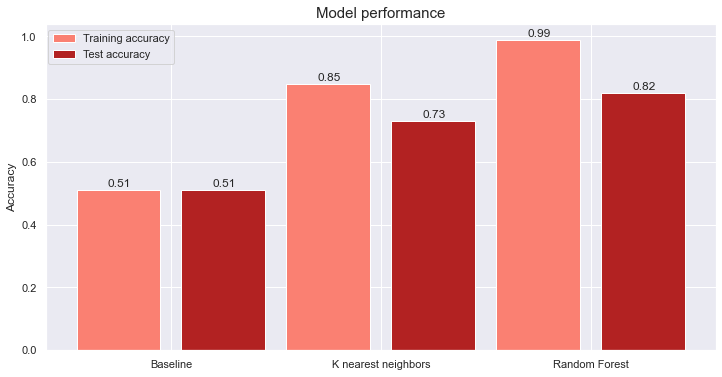

In [36]:
models = ['Baseline','K nearest neighbors','Random Forest']

# define function for adding data labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i+1-0.1,y[i]+0.01,y[i])
# for data labels
x = np.arange(1,7)
y = np.round(list(dummy_acc[:])+list(neigh_acc[:])+list(RF_acc[:]),2)

plt.figure(figsize=(12,6))
plt.bar([1,3,5],y[::2],color='salmon',label='Training accuracy')
plt.bar([2,4,6],y[1::2],color='firebrick',label='Test accuracy')
plt.legend(loc='upper right', bbox_to_anchor=(0.2, 1))

plt.xticks([1.5,3.5,5.5],models)
plt.ylabel('Accuracy')
# calling the function to add value labels
addlabels(x, y)
plt.title('Model performance',fontsize=15)
plt.show()




**Predictions**

In [39]:

def prediction_base(model, month,weekday, hour, lat, long, place):
    
    district = np.zeros(len(districts)).astype(int)
    district[list(districts).index(place)] = 1

    X_new = [month,day,hour,lat,long]+(list(district))
    print(X_new)
    y_new = model.predict([X_new]) #use classifier to predict crime   

    if y_new==0:
        pred = focus[0]
    elif y_new==1:
        pred = focus[1]
    elif y_new==2:
        pred = focus[2]
        
    return pred 

In [51]:
#random.seed(8)
districts = df.district.unique()

for i in range(4):
    day = random.choice(range(7))
    month = random.choice(range(1,13))
    hour= random.choice(range(24))
    place =  random.choice(districts) 
    lat =random.randint(df.latitude.min()*10**14,df.latitude.max()*10**14)/(10**14)
    long =random.randint(df.longitude.min()*10**14,df.longitude.max()*10**14)/(10**14)

    print('Predicted crime on {} in {} from {}:00 to {}:00 in the {} district'.format(day,month, hour,hour+1,place))
    print(prediction_base(RF,month,day, hour, lat,long, place)+'\n')  
    

Predicted crime on 0 in 4 from 16:00 to 17:00 in the sunnydale district
[4, 0, 16, 37.76480098485642, -122.49865522190468, 0, 0, 0, 1]
vandalism

Predicted crime on 3 in 3 from 16:00 to 17:00 in the unknown district
[3, 3, 16, 37.77413448710236, -122.39064874862879, 1, 0, 0, 0]
drug/narcotic

Predicted crime on 0 in 7 from 6:00 to 7:00 in the sunnydale district
[7, 0, 6, 37.75377301088704, -122.38876505063237, 0, 0, 0, 1]
vandalism

Predicted crime on 2 in 6 from 5:00 to 6:00 in the sunnydale district
[6, 2, 5, 37.75300920147693, -122.46588773520497, 0, 0, 0, 1]
vandalism

